# Audio Sample Distributions

__~ Anish Sachdeva__


__DTU/2K16/MC/013__

In [160]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa
import librosa.display
from pydub import AudioSegment
from pydub.silence import split_on_silence
from pydub.playback import play
import os

In [109]:
x, sr = librosa.load('../../data/audio/poem-2.wav')

In [110]:
ipd.Audio('../../data/audio/poem-2.wav')

I am reading the following poem in the audio sample above:
```text
Stopping by Woods on a Snowy Evening
BY ROBERT FROST

Whose woods these are I think I know.   
His house is in the village though;   
He will not see me stopping here   
To watch his woods fill up with snow.   

My little horse must think it queer   
To stop without a farmhouse near   
Between the woods and frozen lake   
The darkest evening of the year.   

He gives his harness bells a shake   
To ask if there is some mistake.   
The only other sound’s the sweep   
Of easy wind and downy flake.   

The woods are lovely, dark and deep,   
But I have promises to keep,   
And miles to go before I sleep,   
And miles to go before I sleep.
```

[Poem Link](https://www.poetryfoundation.org/poems/42891/stopping-by-woods-on-a-snowy-evening)

# Plotting the Waveform

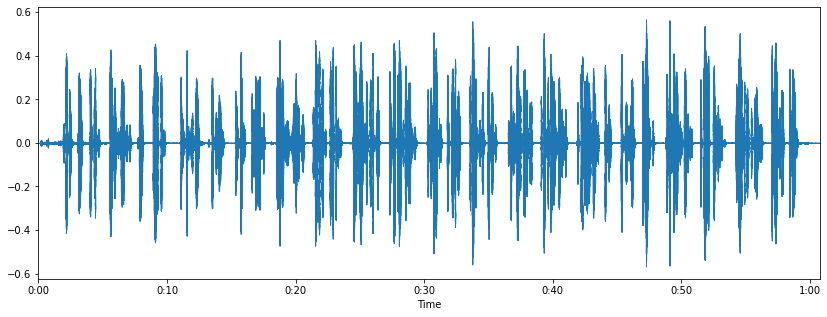

In [111]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [112]:
# sample rate
sr

22050

In [113]:
# length of audio array
x.shape[0] / sr

60.778684807256234

## Displaying the Spectogram

In [114]:
## Displaying the Spectogram
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
Xdb.shape

(1025, 2618)

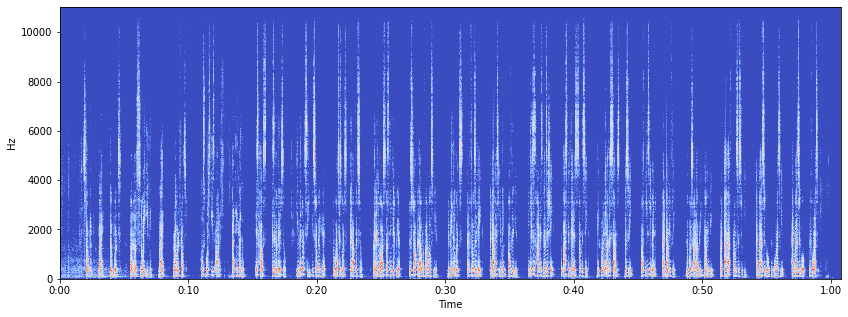

In [115]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

## Segmenting out words from the Audio Frequency

In [301]:
# custom algorithm for word segmentation 
words = []
threshold = 0.003
word_threshold = 50
silence_threshold = 1400
silence = 0

word = []

for orig, elem in zip(x, np.abs(x)):
    if elem < threshold:
        silence += 1
        if silence > silence_threshold and len(word) > word_threshold:
            words.append(word)
            word = []
            silence = 0
    else:
        word.append(orig)

In [302]:
len(words)

188

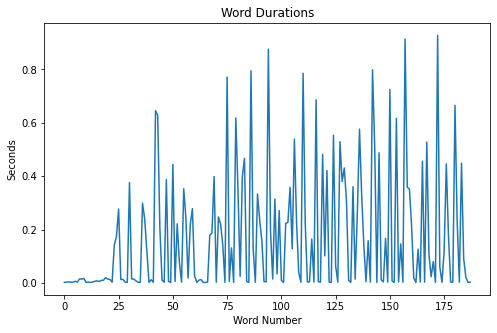

In [304]:
plt.figure(figsize=(8, 5))
plt.title('Word Durations')
plt.plot([len(word) / sr for word in words])
plt.xlabel('Word Durations')
plt.ylabel('Seconds')
plt.show()

In [308]:
sorted([(i, len(word)) for i, word in enumerate(words)], key=lambda x: x[1], reverse=True)[30:40]

[(82, 8753),
 (47, 8548),
 (128, 8381),
 (30, 8289),
 (133, 7952),
 (158, 7916),
 (104, 7897),
 (55, 7784),
 (159, 7759),
 (80, 7739)]

In [305]:
ipd.Audio(words[80], rate=sr)

In [307]:
ipd.Audio(words[69], rate=sr)

In [309]:
ipd.Audio(words[82], rate=sr)

In [310]:
ipd.Audio(words[47], rate=sr)

In [311]:
ipd.Audio(words[159], rate=sr)

## Plotting t-Distribution from the Words

Sampling from a Normal Distribution we get

$$
Z = \frac{\bar{X} - \mu}{\sigma / \sqrt{n}}
$$

Sampling n from the Distribution using student's t-Distribution we have:

$$
t = \frac{\bar{X} - \mu}{s / \sqrt{n}}
$$

In [321]:
pitch_avg = np.array([sum(word) / len(word) for word in words])
pitch_avg.shape

(188,)

In [334]:
n = 30
sqrt_n = np.sqrt(n)
trials = 10_000
sample = np.zeros((trials, 1))
mu = pitch_avg.mean()

for i in range(trials):
    indices = np.random.randint(low=0, high=pitch_avg.shape[0], size=(n, 1))
    X = pitch_avg[indices]
    sample[i] = (X.mean() - mu) / (X.std() / sqrt_n)

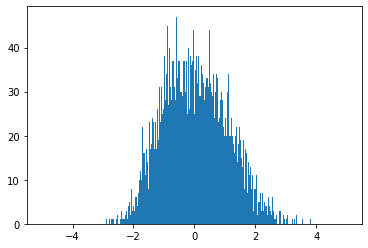

In [353]:
plt.figure(figsize=(8, 5))
plt.hist(sample, bins=np.arange(-5, 5, 0.01))
plt.show()

## Plotting F-Distribution

The probability density of the F-Distribution will be (for $x > 0$):

$$
F(x) = \frac{(\frac{\nu_1}{\nu_2})^{\frac{\nu_1}{2}} \Gamma{\frac{\nu_1 + \nu_2}{2}} x^{\frac{\nu_1}{2} - 1}}{(1 + \frac{\nu_1}{\nu_2} x)^{\frac{\nu_1 + \nu_2}{2}} \Gamma{\frac{\nu_1}{2}} \Gamma{\frac{\nu_2}{2}}}
$$

In [377]:
from scipy.special import factorial as gamma


class FDistribution:
    def __init__(self, nu_1, nu_2):
        self.nu_1 = nu_1
        self.nu_2 = nu_2
        self.pdf = self.pdf_factory()

    def pdf_factory(self):
        const = ((((self.nu_1 / self.nu_2) ** (self.nu_1 / 2)) * gamma((self.nu_1 + self.nu_2) / 2)) / 
                 gamma(self.nu_1 / 2)) / gamma(self.nu_2 / 2)

        def pdf(x):
            return (const * (x ** (self.nu_1 / 2 - 1))) / \
                   ((1 + x * self.nu_1 / self.nu_2) ** ((self.nu_1 + self.nu_2) / 2))

        return pdf

### Plotting a few F-Distributions

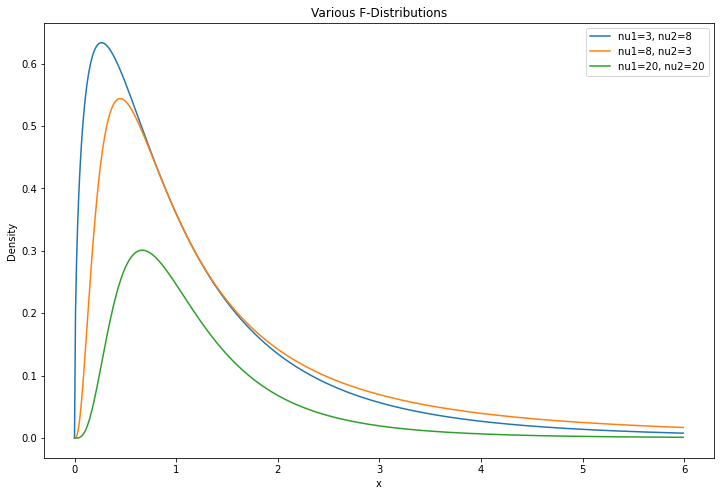

In [378]:
F_3_8 = FDistribution(3, 8)
F_8_3 = FDistribution(8, 3)
F_20_20 = FDistribution(10, 10)
X = np.arange(0, 6, 0.01)

plt.figure(figsize=(12, 8))
plt.plot(X, F_3_8.pdf(X), label='nu1=3, nu2=8')
plt.plot(X, F_8_3.pdf(X), label='nu1=8, nu2=3')
plt.plot(X, F_20_20.pdf(X), label='nu1=20, nu2=20')

plt.legend()
plt.title('Various F-Distributions')
plt.ylabel('Density')
plt.xlabel('x')

plt.show()

### Making F-Distribution from the Word Pitches

Text(0, 0.5, 'Probability Density')

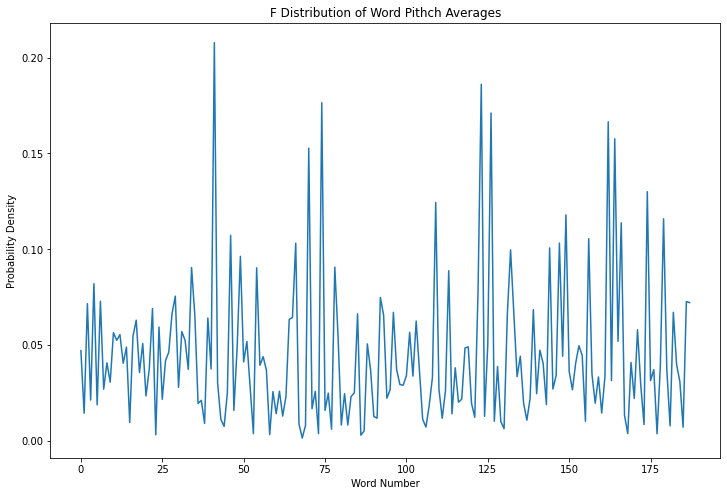

In [385]:
plt.figure(figsize=(12, 8))
plt.plot(np.arange(len(pitch_avg)), F_3_8.pdf(np.abs(pitch_avg)))
plt.title('F Distribution of Word Pithch Averages')
plt.xlabel('Word Number')
plt.ylabel('Probability Density')

## k-Distribution

The pdf of the K-Distribution depends on three factors $\alpha$, $\beta$ and $\mu$.

$$
f_{X}(x ; \alpha, \beta, \mu) = \frac{2}{\Gamma{(\alpha)} \Gamma{(\beta)}} \left(\frac{\alpha \beta}{\mu}\right)^{\frac{\alpha +\beta}{2}} x^{\frac{\alpha + \beta}{2} - 1} K_{\alpha - \beta} \left( 2 \sqrt{\frac{\alpha \beta x}{\mu}}\right)
$$

In [400]:
from scipy.special import factorial as gamma
from scipy.special import yn as bessel_2
import numpy as np


class KDistribution:
    def __init__(self, mu, alpha, beta):
        self.mu = mu
        self.alpha = alpha
        self.beta = beta
        self.pdf = self.pdf_factory()

    def pdf_factory(self):
        sum_alpha_beta = self.alpha + self.beta
        product = self.alpha * self.beta
        difference = self.alpha - self.beta
        const = (2 / (gamma(self.alpha) * gamma(self.beta))) * ((product / self.mu) ** (sum_alpha_beta / 2))

        def pdf(x):
            return const * x ** (sum_alpha_beta / 2 - 1) * bessel_2(difference, 2 * np.sqrt(product * x / self.mu))

        return pdf

In [405]:
K_1 = KDistribution(1, 1, 2)

c:\users\anish\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in multiply


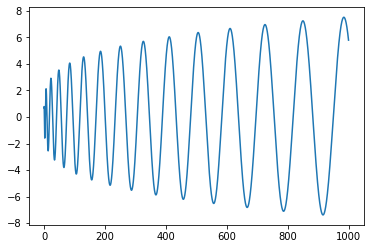

In [406]:
X = np.arange(0, 1000, 0.01)
plt.plot(X, K_1.pdf(X))
plt.show()

### Applying K Distribution over words

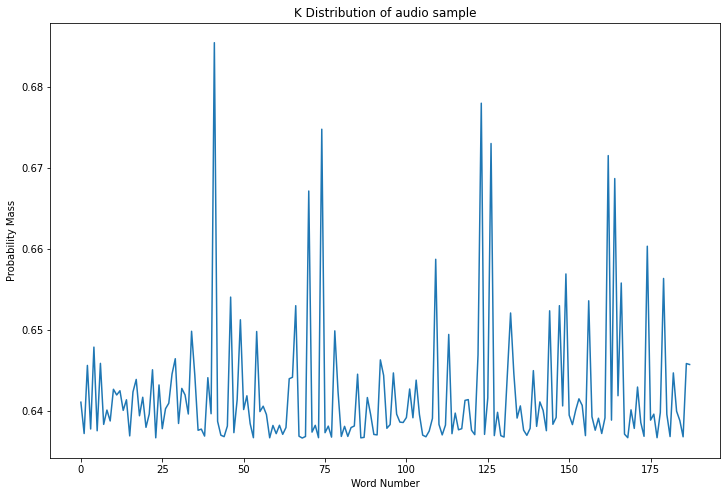

In [412]:
plt.figure(figsize=(12, 8))
plt.plot(np.arange(len(pitch_avg)), K_1.pdf(np.abs(pitch_avg)))
plt.title('K Distribution of audio sample')
plt.xlabel('Word Number')
plt.ylabel('Probability Mass')
plt.show()

## Plotting F-Distribution and k_Distribution Together

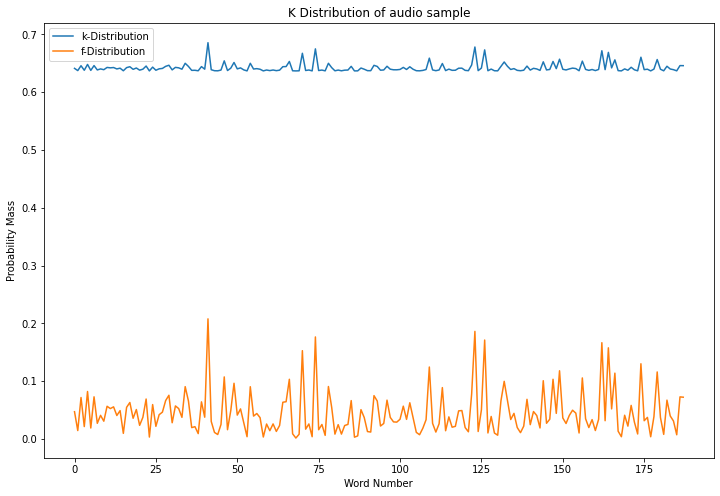

In [414]:
plt.figure(figsize=(12, 8))
plt.plot(np.arange(len(pitch_avg)), K_1.pdf(np.abs(pitch_avg)), label='k-Distribution')
plt.plot(np.arange(len(pitch_avg)), F_3_8.pdf(np.abs(pitch_avg)), label='f-Distribution')
plt.title('K Distribution of audio sample')
plt.xlabel('Word Number')
plt.ylabel('Probability Mass')
plt.legend()
plt.show()